# Velocity

In [1]:
# Library imports
from PIL import Image
import time, math, cv2, imutils, os, json, random
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import torch
import torch.utils.data
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from collections import defaultdict
from torchvision.transforms import functional as F
from engine import train_one_epoch, evaluate
import utils
import transforms as T

## Load the trained model

In [ ]:
model = torch.load(r'C:\Users\Samer\Desktop\COMP9517\Project\Individual\carDetectionModel.pkl') #change path to your model dir
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

# The following cell is code written by Liam and Jeremy (Not sure if someone else's too) for Detection and Distance tasks.

In [3]:
def get_transform(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
    transforms.append(T.ToTensor())
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

class CarDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all labels
        self.clip_nums = [x for x in os.listdir(self.root) if 'DS_Store' not in x]
        self.img_paths = [Path(root).joinpath(num).joinpath('imgs').joinpath('040.jpg') for num in self.clip_nums]
        self.anno = [Path(root).joinpath(x).joinpath('annotation.json') for x in self.clip_nums]

    def __getitem__(self, idx):
        # load images and masks
        anno_pth = self.anno[idx]
        with open(anno_pth) as f:
          anno_data = json.load(f)
        
        img_path = self.img_paths[idx]
        img = Image.open(img_path).convert("RGB")

        mask = np.zeros(np.array(img).shape[0:2])
        boxes = []        
        position = []   
        velocity = []
        all_boxes = []
        for car in anno_data:
            left = int(car['bbox']['left'])
            right = int(car['bbox']['right'])
            top = int(car['bbox']['top'])
            bottom = int(car['bbox']['bottom'])
            start_point = (left, top)
            end_point = (right, bottom)  
            color =  1
            thickness = -1
            # Add bounding box
            mask = cv2.rectangle(mask, start_point, end_point, color, thickness)
            if ('position' in car.keys()):
                position += [car['position']]
            if ('velocity' in car.keys()):
                velocity += [car['velocity']]
            all_boxes += [[left, top, right, bottom]]

        mask = np.array(mask)
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]

        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:, None, None]
        num_objs = len(obj_ids)

        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        target = {}
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target["boxes"] = boxes
        target["allboxes"] = all_boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd
        target["position"] = position
        target["velocity"] = velocity

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.img_paths)

# made some changes but the result is the same 
def distance(box, shape=(720,1280)):
    fx = 414.1526 # px
    fy = 710.3725 # px
    cx = 713.85   # px
    cy = 327.0    # px

    avg_car_width = 1.80 # meters
    avg_car_height = 1.58 # meters
    camera_height = 1.80 # meters
    rescale = 2.2
    truck_ratio = 0.92
    h, w = shape[0], shape[1]

    c_w = (box['right'] - box['left'])
    c_h = (box['bottom'] - box['top'])
    
    if (c_h <= c_w * truck_ratio): # height is more reliable, unless it's a tall vehicle 
        dist_estim = fy * avg_car_height / c_h
    else:
        dist_estim = rescale * fx * avg_car_width / c_w
    
    dist_from_c = w / 2 - (box['right'] + box['left']) / 2
    res = [dist_estim, dist_from_c, c_h, c_w]
    
    
    # split in x-z coordinates
    y_offset = -2.2 # Since camera isn't centered
    dist_offset = 0.3

    dist_estim = res[0]
    x0         = res[1]
    c_h        = res[2]

    Y0 = -x0 * avg_car_height / c_h + y_offset

    if (dist_estim < abs(Y0)):
        X0 = 0
    else:
        X0 = math.sqrt((dist_estim+dist_offset)*(dist_estim+dist_offset) - Y0*Y0 - camera_height*camera_height/4)

    return math.sqrt(X0*X0 + Y0*Y0), (X0, Y0)
    

# Velocity

In [4]:

class CarSequence(torch.utils.data.Dataset):
    # class for keeping track of frames (for the velocity task)
    def __init__(self, root):
        self.root = root
        #self.clip_nums = [x for x in os.listdir(self.root) if 'DS_Store' not in x]
        self.clip_nums = [x for x in range(len(os.listdir(self.root)))]

    def __getitem__(self, idx):
        try:
            img_nums = os.listdir(Path(self.root).joinpath(str(idx)).joinpath('imgs'))
        except FileNotFoundError:
            raise Exception('File not found')
        img_paths = [Path(self.root).joinpath(str(idx)).joinpath('imgs').joinpath(x) for x in img_nums]
        return img_paths

def show_image(image, gray=False, size=(10, 20), title=None, save_title=None):
    plt.style.use('seaborn')
    plt.figure(figsize=(size[0], size[1]))
    plt.title(title, fontweight='bold', size=20)
    if gray:
        plt.imshow(image, cmap='gray', vmin=0, vmax=255)
    else:
        plt.imshow(image, vmin=0, vmax=255)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    if save_title:
        plt.savefig(save_title+'.jpg')
    plt.show()

def area(box):
    area = abs(box['right'] - box['left'] + 1) * abs(box['bottom'] - box['top'] + 1)
    return area

def intersection(box1, box2):
    xA = max(box1['left'], box2['left'])
    yA = max(box1['top'], box2['top'])
    xB = min(box1['right'], box2['right'])
    yB = min(box1['bottom'], box2['bottom'])
    intersection = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    return intersection

def union(box1, box2):
    box1_area = area(box1)
    box2_area = area(box2)
    inter = intersection(box1, box2)
    return box1_area + box2_area - inter
    
def IoU(box1, box2):
    i = intersection(box1, box2)
    u = union(box1, box2)
    return i/u


def get_bboxes(mask, offset=None):
    # get bboxes from mask (bboxes returned from the model are not suitable,
    # but can be retrieved from the mask)
    # applies connected components algorithm to get bboxes
    equivalencies = {}
    box_areas=defaultdict(list)
    labels = np.zeros(mask.shape).astype(int)
    rows = mask.shape[0]
    cols = mask.shape[1]
    label = 1

    for i in range(rows):
        for j in range(cols):
            current = mask[i][j]
            north = None
            north_label = None
            west = None
            west_label = None

            if i > 0:
                try:
                    north = mask[i-1][j]
                    if north:
                        north_label = labels[i-1][j]
                    else:
                        north = None
                        north_label = None
                except:
                    pass
            if j > 0:
                try:
                    west = mask[i][j-1]
                    if west:
                        west_label = labels[i][j-1]
                    else:
                        west = None
                        west_label = None
                except:
                    pass

            if north and west:
                if north_label == west_label:
                    labels[i][j] = north_label
                else:
                    min_label = int(min(north_label, west_label))
                    max_label = int(max(north_label, west_label))
                    if min_label not in equivalencies[max_label]:
                        equivalencies[max_label].append(min_label)
                    labels[i][j] = min_label

            elif north:
                labels[i][j] = north_label

            elif west:
                labels[i][j] = west_label

            else:
                if current:
                    labels[i][j] = label
                    equivalencies[label]=[label]
                    label += 1

    for i in equivalencies.keys():
        equivalencies[i] = int(min(equivalencies[i]))
        equivalencies[i] = equivalencies[equivalencies[i]]

    for i in range(rows):
        for j in range(cols):
            if labels[i][j]:
                labels[i][j] = equivalencies[labels[i][j]]
                box_areas[labels[i][j]].append((i,j))

    bboxes=[]
    for i in box_areas:
        box = np.array(box_areas[i])
        box.reshape(-1, 2)
        box = np.hsplit(box, 2)
        rows = box[0]
        cols = box[1]
        left = np.amin(cols)
        top = np.amin(rows)
        right = np.amax(cols)
        bottom = np.amax(rows)
        if offset:
            bboxes.append({'top': top+offset['top'], 'left': left+offset['left'], 'bottom': bottom+offset['top'], 'right': right+offset['left']})
        else:
            bboxes.append({'top': top, 'left': left, 'bottom': bottom, 'right': right})
    return bboxes



def get_sequence(dataset, n):
    # getting bboxes of all the frames of the input image
    # obsolete, may get scrapped
    seq = dataset[n]
    seq_boxes = {}
    for i in range(len(seq)):
        img = Image.open(seq[i]).convert("RGB")
        img = F.to_tensor(img)
        model.eval()
        with torch.no_grad():
            prediction = model([img.to(device)])
        image = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
        mask = np.zeros(img.shape[1:])
        for n in range(len(prediction[0]['masks'])):
            mask += prediction[0]['masks'][n, 0].mul(255).byte().cpu().numpy()
        mask = np.array(mask)
        mask *= (255.0/mask.max())
        cv_image = np.array(image)
        mask = cv2.normalize(src=mask, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
        _, mask = cv2.threshold(mask, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        m = cv2.findNonZero(mask)
        m = m.reshape(-1, 2)
        m = np.hsplit(m, 2)
        cols = m[0]
        rows = m[1]
        left = np.amin(cols)
        top = np.amin(rows)
        right = np.amax(cols)
        bottom = np.amax(rows)
        offset = {'top':top, 'left':left}
        roi = mask[top:bottom, left:right]
        bboxes = get_bboxes(roi, offset)
        seq_boxes[i] = bboxes
    return seq, seq_boxes



def detect(img, visualize=False):
    # takes image as input, and returns estimated bboxes
    img = F.to_tensor(img)
    model.eval()
    with torch.no_grad():
        prediction = model([img.to(device)])
    image = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
    mask = np.zeros(img.shape[1:])
    for n in range(len(prediction[0]['masks'])):
        mask += prediction[0]['masks'][n, 0].mul(255).byte().cpu().numpy()
    mask = np.array(mask)
    mask *= (255.0/mask.max())
    # normalizing to CV_8UC1 for thresholding
    mask = cv2.normalize(src=mask, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
    # applying otsu
    _, mask = cv2.threshold(mask, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    # other techniques I tried, Mean Adaptive Threshold gave some good results too
    #mask = contrast_stretch(mask)
    #t, mask = cv2.threshold(mask, 60, 255, cv2.THRESH_BINARY)
    #mask - cv2.medianBlur(mask, 7)
    #mask = cv2.adaptiveThreshold(mask, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 73, 0)
    #mask = cv2.adaptiveThreshold(mask, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 999, 2)

    # extracting only the area that contains all masks (for efficiency)
    m = cv2.findNonZero(mask)
    m = m.reshape(-1, 2)
    m = np.hsplit(m, 2)
    cols = m[0]
    rows = m[1]
    left, top, right, bottom = np.amin(cols), np.amin(rows), np.amax(cols), np.amax(rows)
    # offset (top left corner of the mask)
    offset = {'top':top, 'left':left}
    roi = mask[top:bottom, left:right]
    # apply connected components, add the offset later to the found boxes
    # to scale back to the original image's size
    bboxes = get_bboxes(roi, offset)
    # draw bboxes
    if visualize:
        cv_image = np.array(image)
        for box in bboxes:
            top, left, bottom, right = int(box['top']), int(box['left']), int(box['bottom']), int(box['right'])
            cv_image = cv2.rectangle(cv_image, (left, top), (right, bottom), (0,200,0), 2)
        show_image(cv_image)
    return bboxes



def track(dataset, n, visualize=False, skip=False):
    # because we have the labels in the last frame only, this algorithm
    # detects bboxes from last frame and backtracks to the first one.
    # detection is more computatinally expensive than tracking, and so, while iterating frames
    # I don't detect each frame, instead I am using 2 sets of multitracker from opencv which worked well.
    # bbox to refer to format {'left':x, 'top':x, 'right':x, 'bottom':x} which is used for distance and drawing
    # box to refer to format (left, top, left_offset, top_offset) which is used for tracking
    # dataset is a CarSequence() object
    # running latest version of opencv-contrib, if you have older version try cv2.MultiTracker_create() instead.
    # estimates = {
    #               vehicle1:{
    #                          frame40:{dist:x, pos:x, bbox:{'left':x, 'top':x, 'right':x, 'bottom':x}}, 
    #                          frame39:{dist:x, pos:x, bbox:{'left':x, 'top':x, 'right':x, 'bottom':x}},
    #                           ...
    #                        },
    #               vehicle2:{
    #                          frame40:{dist:x, pos:x, bbox:{'left':x, 'top':x, 'right':x, 'bottom':x}},
    #                          frame39:{dist:x, pos:x, bbox:{'left':x, 'top':x, 'right':x, 'bottom':x}},
    #                           ...
    #                        },
    #                  ...
    #              }
    skip = skip # for visualization (e.g. display every 5th image)
    estimates = defaultdict(lambda: defaultdict(int))
    # creating 2 multitrackers, one for median flow and one for MIL
    # median flow is capable of resizing bbox when tracking but lacks in recall, and less accurate then MIL,
    # therefore I am substituting whatever median flow fails to track with MIL tracked box.
    # keeping bboxes as tight and containing as possible is very important and affects distance since Jeremy is applying distance by width.
    trackers_MIL = cv2.legacy.MultiTracker_create()
    trackers_MF = cv2.legacy.MultiTracker_create()
    seq = dataset[n]
    img_path = seq[len(seq)-1]
    frame = Image.open(img_path).convert("RGB")
    bboxes = detect(frame)
    frame = np.array(frame)
    # setting estimates first values from last frame (idx 40) and then tracking backwards
    for i in range(len(bboxes)):
        dist, pos = distance(bboxes[i])
        estimates[i] = {len(seq):{'dist':dist, 'pos':pos, 'bbox':bboxes[i]}}
        top, left, bottom, right = bboxes[i]['top'], bboxes[i]['left'], bboxes[i]['bottom'], bboxes[i]['right']
        box = (left, top, right-left, bottom-top)
        # creating a tracker for each box in the last frame and adding to the multitracker set
        tracker_MIL = cv2.legacy.TrackerMIL_create()
        tracker_MF = cv2.legacy.TrackerMedianFlow_create()
        trackers_MIL.add(tracker_MIL, frame, box)
        trackers_MF.add(tracker_MF, frame, box)
        frame = cv2.rectangle(frame, (left, top), (right, bottom), (0, 200, 0), 3)
    if visualize:
        show_image(frame)
    
    # keep track of previous frame idx
    previous = len(seq)
    for fr in range(len(seq)-1, 0, -1):
        img_path = seq[fr]
        frame = Image.open(img_path).convert("RGB")
        frame = np.array(frame)
        _, boxes_MF = trackers_MF.update(frame)
        _, boxes_MIL = trackers_MIL.update(frame)
        for box in boxes_MF:
            p1 = (int(box[0]), int(box[1]))
            p2 = (int(box[0] + box[2]), int(box[1] + box[3]))
            bbox = {'left':p1[0], 'top':p1[1], 'right':p2[0], 'bottom':p2[1]}
            found = False
            # calculate iou for bbox with previous frame bboxes to know to which vehicle to add the new bbox
            # probably unnecessary, maybe the tracker keeps order, I will check this later, but as I'm
            # using 2 sets of trackers it might be justified.
            for vehicle in estimates:
                iou = IoU(estimates[vehicle][previous]['bbox'], bbox)
                if iou >= 0.5:
                    found = True
                    dist, pos = distance(bbox)
                    estimates[vehicle][fr] = {}
                    estimates[vehicle][fr]['dist'] = dist
                    estimates[vehicle][fr]['pos'] = pos
                    estimates[vehicle][fr]['bbox'] = bbox
                    frame = cv2.rectangle(frame, p1, p2, (0,200,0), 3)
                    break
            # if none found, substitute with MIL tracked box
            if not found:
                for box in boxes_MIL:
                    p1 = (int(box[0]), int(box[1]))
                    p2 = (int(box[0] + box[2]), int(box[1] + box[3]))
                    bbox = {'left':p1[0], 'top':p1[1], 'right':p2[0], 'bottom':p2[1]}
                    for vehicle in estimates:
                        if estimates[vehicle][fr]:
                            continue
                        iou = IoU(estimates[vehicle][previous]['bbox'], bbox)
                        if iou >= 0.5:
                            dist, pos = distance(bbox)
                            estimates[vehicle][fr] = {}
                            estimates[vehicle][fr]['dist'] = dist
                            estimates[vehicle][fr]['pos'] = pos
                            estimates[vehicle][fr]['bbox'] = bbox
                            frame = cv2.rectangle(frame, p1, p2, (0,200,0), 3)
                            break
        previous = fr
        if visualize:
            if skip and fr>0 and fr%skip==0:
                show_image(frame)

    return estimates



def velocity(dataset, n, skip=5, length=2, visualize=False):
    result=[]
    seq = dataset[n]
    # interval: amount of time between consequtive frames = 2s/40f
    interval=length/len(seq)
    # skip: how many frames skipped from t1 and t2
    skip=skip
    # dt: change in time
    dt = skip*interval
    pairs=[]
    for i in range(1, len(seq)-skip):
        pairs.append([i, i+skip])
    estimates = track(dataset=dataset, n=n, visualize=False)

    # getting velocities of all pairs of frames
    for vehicle in estimates:
        vel = []
        for pair in pairs:
            fr1, fr2 = pair[0], pair[1]
            x1, y1 = estimates[vehicle][fr1]['pos'][0], estimates[vehicle][fr1]['pos'][1]
            x2, y2 = estimates[vehicle][fr2]['pos'][0], estimates[vehicle][fr2]['pos'][1]
            dx = (x2 - x1) / dt
            dy = (y2 - y1) / dt
            vel.append([dx, dy])
        vel = np.array(vel).reshape(-1, 2)
        vel = np.hsplit(vel, 2)
        # averaging over x velovities and y velocities
        x = np.mean(vel[0])
        y = np.mean(vel[1])
        estimates[vehicle][len(seq)]['velocity'] = (x, y)    
        result.append(estimates[vehicle][len(seq)])
    
    if visualize:
        font = cv2.FONT_HERSHEY_SIMPLEX
        img_path = seq[len(seq)-1].__str__()
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        for vehicle in result:
            bbox = vehicle['bbox']
            pos = vehicle['pos']
            vel = vehicle['velocity']
            top, left, bottom, right = bbox['top'], bbox['left'], bbox['bottom'], bbox['right']
            img = cv2.rectangle(img, (left, top), (right, bottom), (0, 200, 0), 3)
            img = cv2.putText(img, "v:({:.2f}, {:.2f}) m/s".format(vel[0], vel[1]), (left, top-30), font, .6, (0,220,0), 2, cv2.FILLED)
            img = cv2.putText(img, "pos:({:.2f}, {:.2f})m".format(pos[0], pos[1]), (left, top-10), font, .6, (0,220,0), 2, cv2.FILLED)
        show_image(img, size=(20, 10))
    return result



## Load Data (Change to your dir)

In [5]:
TRAIN_DIR = r'C:\Users\Samer\Desktop\COMP9517\Project\Individual\train\clips'
dataset_train = CarDataset(TRAIN_DIR, get_transform(train=True))
sequence_train = CarSequence(TRAIN_DIR)

TEST_DIR = r'C:\Users\Samer\Desktop\COMP9517\Project\Individual\test\clips'
dataset_test = CarDataset(TEST_DIR, get_transform(train=False))
sequence_test = CarSequence(TEST_DIR)

## The following cell written by Liam. detection demo: mask

C:\Users\Samer\AppData\Local\Programs\Python\Python37\lib\site-packages\torchvision\ops\boxes.py:101: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  ..\torch\csrc\utils\python_arg_parser.cpp:766.)
  keep = keep.nonzero().squeeze(1)


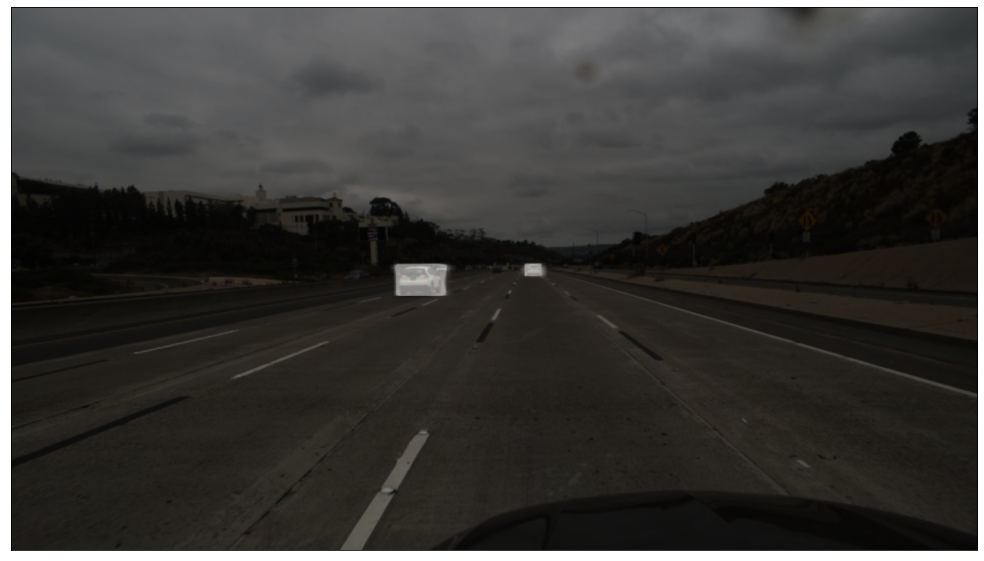

In [6]:
idx = 0
# pick one image from the test set
img, _ = dataset_test[idx]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])

image = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())

plt.figure(figsize=(20,10))
plt.imshow(image)
mask = np.zeros(img.shape[1:])

for n in range(len(prediction[0]['masks'])):
    mask += prediction[0]['masks'][n, 0].mul(255).byte().cpu().numpy()

mask = Image.fromarray(mask)

plt.imshow(mask, cmap='jet', alpha=0.50)
plt.grid(False)
plt.xticks([])
plt.yticks([])
plt.show()


## detection demo: bounding boxes
## same result as detect() function, here showing the mask too

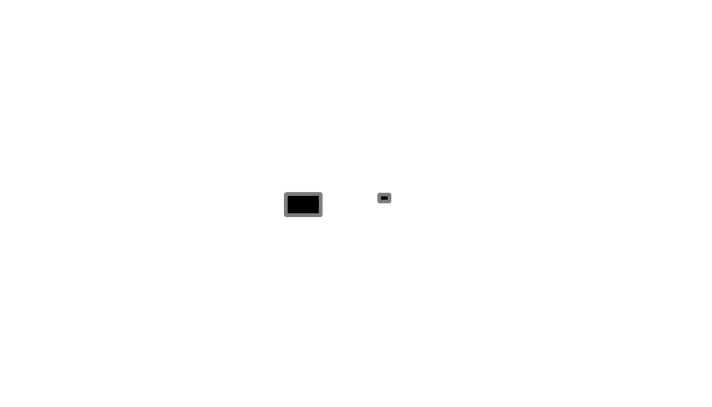

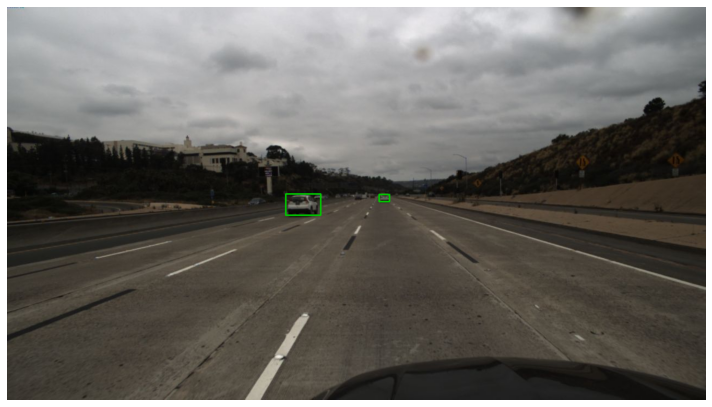

In [7]:
idx = 0
img, _ = dataset_test[idx]
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])
image = Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())
mask = np.zeros(img.shape[1:])
for n in range(len(prediction[0]['masks'])):
    mask += prediction[0]['masks'][n, 0].mul(255).byte().cpu().numpy()

cv_image = np.array(image)
mask = np.array(mask)
mask *= (255.0/mask.max())
# normalizing to CV_8UC1 for thresholding
mask = cv2.normalize(src=mask, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8UC1)
# applying otsu
_, mask = cv2.threshold(mask, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# other thresholding techniques I tried, Mean Adaptive Threshold gave some good results too
#mask = contrast_stretch(mask)
#t, mask = cv2.threshold(mask, 60, 255, cv2.THRESH_BINARY)
#mask - cv2.medianBlur(mask, 7)
#mask = cv2.adaptiveThreshold(mask, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 73, 0)
#mask = cv2.adaptiveThreshold(mask, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 999, 2)

# extracting only the area that contains all masks (for efficiency)
m = cv2.findNonZero(mask)
m = m.reshape(-1, 2)
m = np.hsplit(m, 2)
cols = m[0]
rows = m[1]
left = np.amin(cols)
top = np.amin(rows)
right = np.amax(cols)
bottom = np.amax(rows)
# pass offset (top left corner of the mask)
# and add it later to the found boxes to scale back to original image
offset = {'top':top, 'left':left}
roi = mask[top:bottom, left:right]
# apply connected components
bboxes = get_bboxes(roi, offset)

# draw bboxes
for box in bboxes:
    #box_area = area(box)
    #if (box_area < 300) or (box_area > 400000):
    #    continue
    top, left, bottom, right = int(box['top']), int(box['left']), int(box['bottom']), int(box['right'])
    cv_image = cv2.rectangle(cv_image, (left, top), (right, bottom), (0,200,0), 2)
    mask = cv2.rectangle(mask, (left, top), (right, bottom), (150), 5)
show_image(mask)
show_image(cv_image)


## same as above

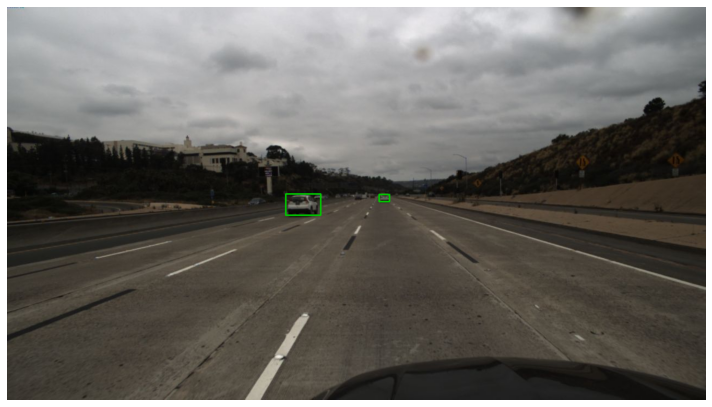

{'top': 342, 'left': 510, 'bottom': 381, 'right': 574}
{'top': 343, 'left': 681, 'bottom': 356, 'right': 700}


In [14]:
img_path = sequence_test[1][39]
image = Image.open(img_path).convert("RGB")
bboxes = detect(image, visualize=True)
for i in bboxes:
    print(i)

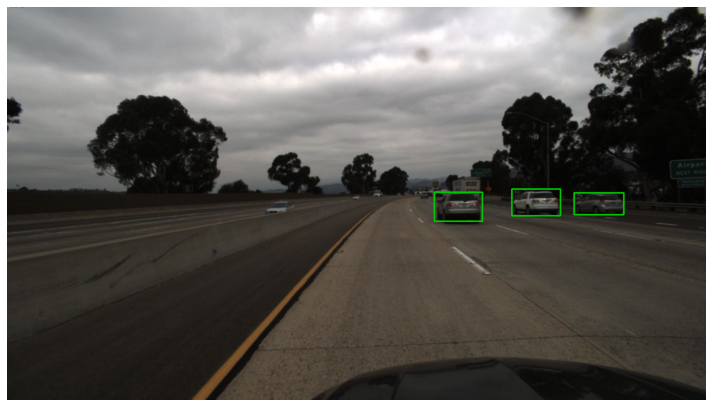

{'top': 333, 'left': 924, 'bottom': 382, 'right': 1013}
{'top': 339, 'left': 782, 'bottom': 392, 'right': 870}
{'top': 340, 'left': 1038, 'bottom': 380, 'right': 1129}


In [15]:
img_path = sequence_train[1][39]
image = Image.open(img_path).convert("RGB")
bboxes = detect(image, visualize=True)
for i in bboxes:
    print(i)

# Object Tracking

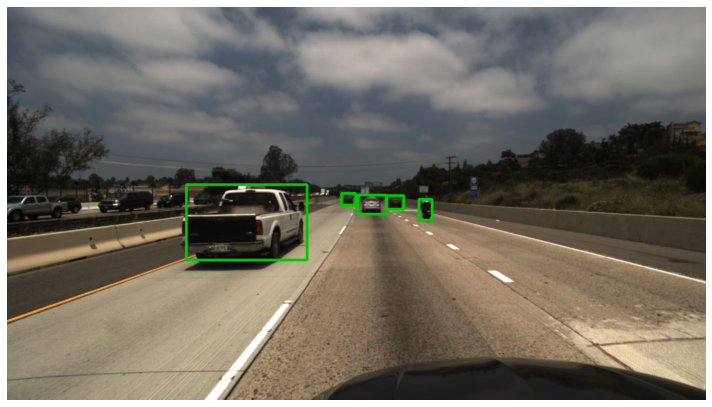

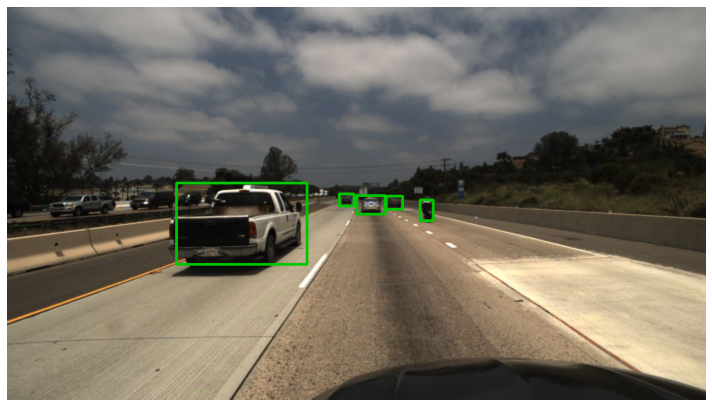

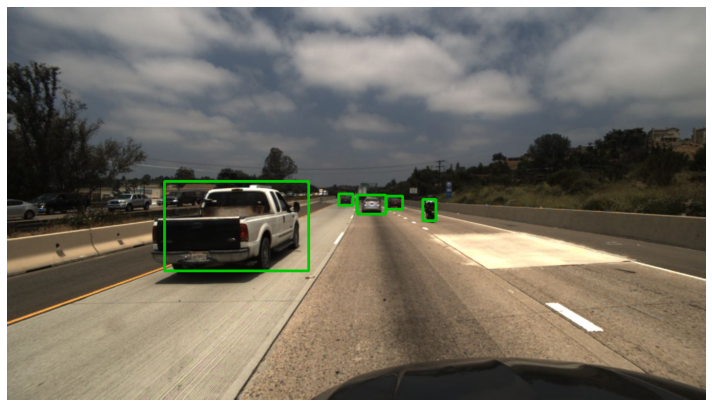

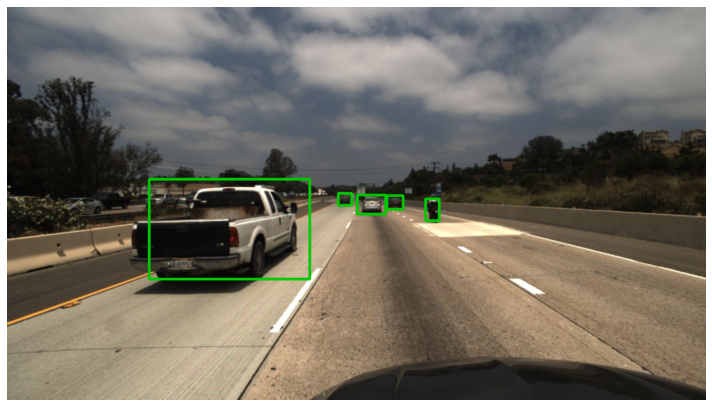

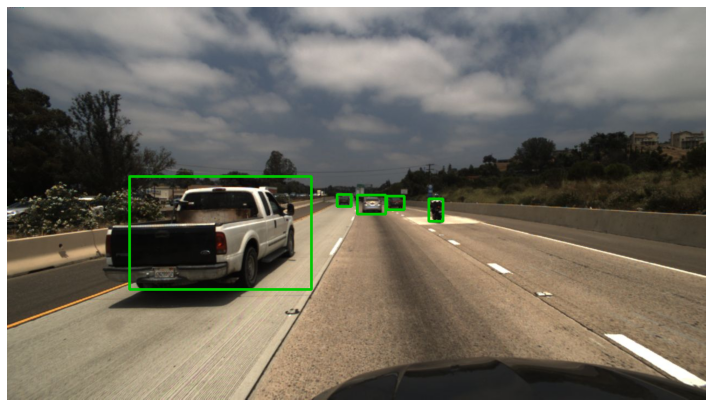

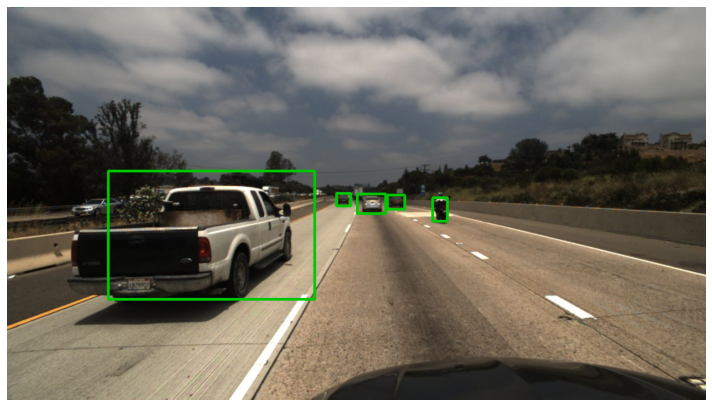

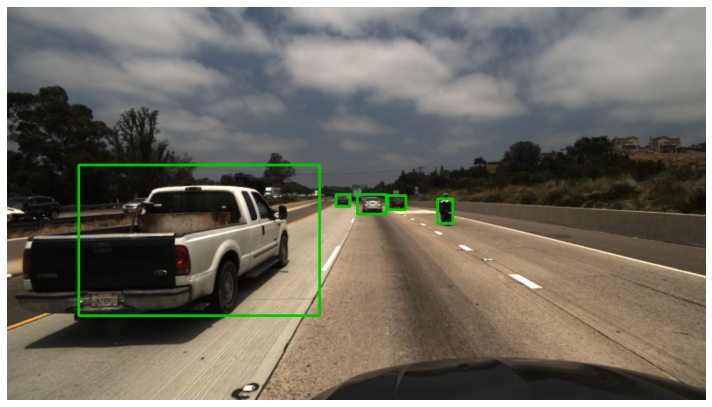

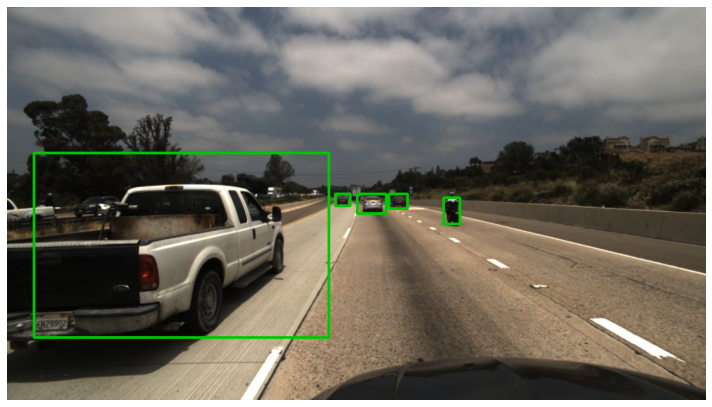

In [16]:
estimates = track(sequence_train, 10, visualize=True, skip=5)

In [18]:
for vehicle in estimates:
    for frame in estimates[vehicle]:
        print(vehicle, frame, estimates[vehicle][frame])
    break

0 40 {'dist': 8.3850886503096, 'pos': (7.07081334765304, -4.5070289855072465), 'bbox': {'top': 325, 'left': 328, 'bottom': 463, 'right': 549}}
0 39 {'dist': 8.3850886503096, 'pos': (7.07081334765304, -4.5070289855072465), 'bbox': {'left': 328, 'top': 325, 'right': 549, 'bottom': 463}}
0 38 {'dist': 8.211025821911125, 'pos': (6.877290951640371, -4.485957446808511), 'bbox': {'left': 323, 'top': 323, 'right': 549, 'bottom': 464}}
0 37 {'dist': 8.044174515076586, 'pos': (6.69071719008535, -4.4657638888888895), 'bbox': {'left': 319, 'top': 323, 'right': 548, 'bottom': 467}}
0 36 {'dist': 7.884093271278445, 'pos': (6.510645294160857, -4.44639455782313), 'bbox': {'left': 314, 'top': 322, 'right': 548, 'bottom': 469}}
0 35 {'dist': 7.780931677937185, 'pos': (6.395229861107579, -4.432147651006712), 'bbox': {'left': 310, 'top': 322, 'right': 549, 'bottom': 471}}
0 34 {'dist': 7.680485495961097, 'pos': (6.282410021714559, -4.418278145695364), 'bbox': {'left': 307, 'top': 321, 'right': 549, 'botto

# Velocity. Final Results.

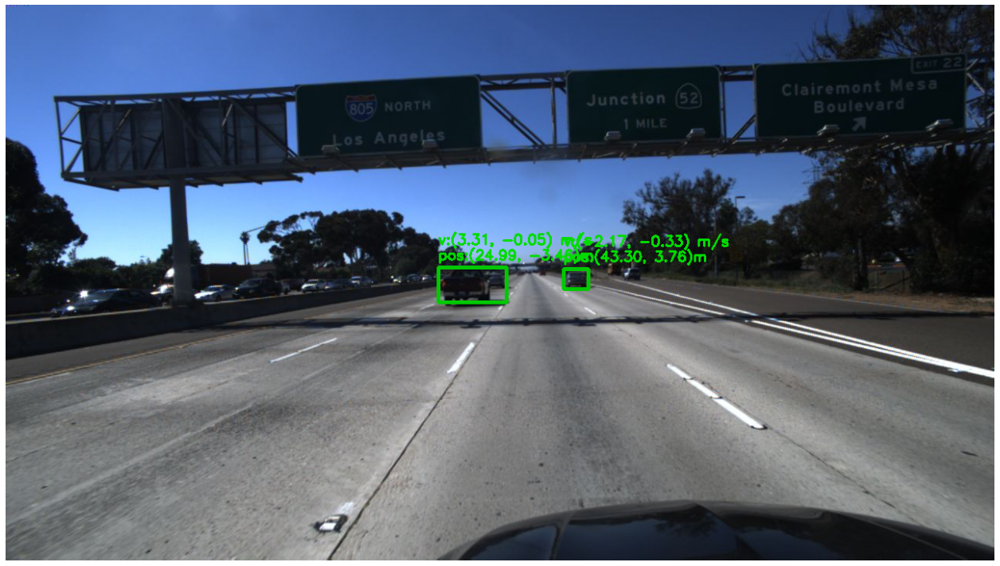

In [20]:
estimates = velocity(sequence_train, 12, visualize=True)

In [21]:
for v in estimates:
    print(v)

{'dist': 25.225917967328197, 'pos': (24.986949419534422, -3.4640000000000004), 'bbox': {'top': 340, 'left': 560, 'bottom': 385, 'right': 648}, 'velocity': (3.3084968018243868, -0.05366348332192024)}
{'dist': 43.459472356456764, 'pos': (43.29691471562567, 3.7553846153846155), 'bbox': {'top': 342, 'left': 722, 'bottom': 368, 'right': 754}, 'velocity': (-2.168249257747115, -0.32529878024788467)}


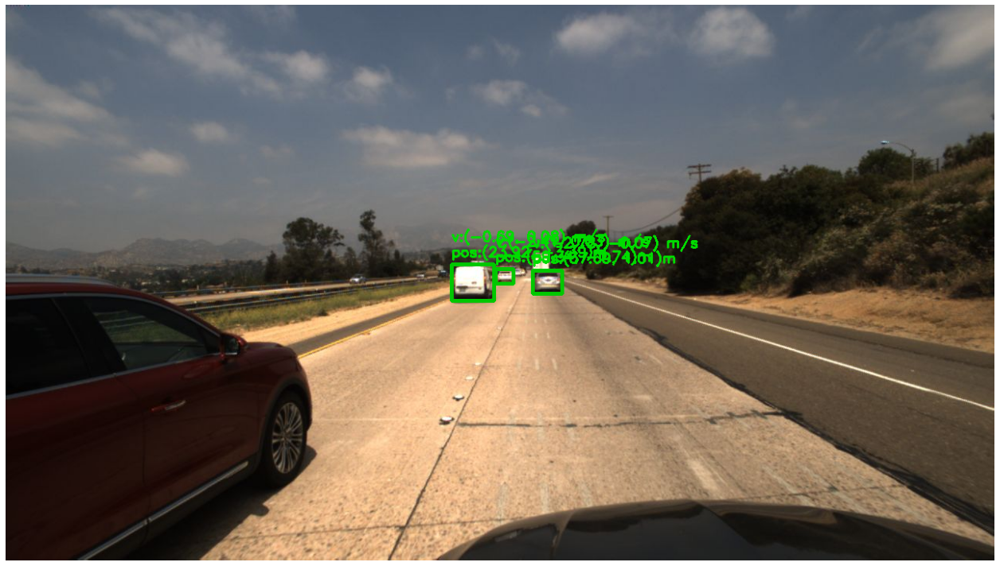

In [22]:
estimates = velocity(sequence_train, 44, visualize=True)

In [23]:
for v in estimates:
    print(v)

{'dist': 24.163852683226057, 'pos': (23.92439307603503, -3.3934042553191492), 'bbox': {'top': 336, 'left': 577, 'bottom': 383, 'right': 632}, 'velocity': (-0.6864698544014938, 0.08398462724870741)}
{'dist': 59.36625991403146, 'pos': (59.340677880863424, -1.7426315789473685), 'bbox': {'top': 342, 'left': 634, 'bottom': 361, 'right': 657}, 'velocity': (-2.4078259616872137, 0.029046115866367215)}
{'dist': 37.702211120998406, 'pos': (37.688608751644814, 1.0126666666666666), 'bbox': {'top': 344, 'left': 682, 'bottom': 374, 'right': 720}, 'velocity': (-2.775108855621817, -0.07419150488979695)}


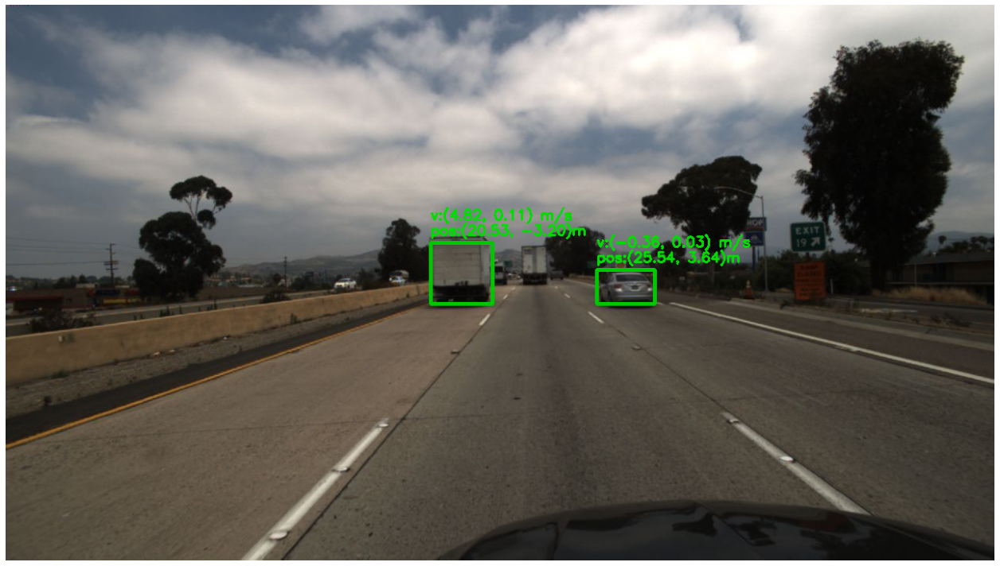

In [24]:
estimates = velocity(sequence_train, 45, visualize=True)

In [25]:
for v in estimates:
    print(v)

{'dist': 20.78107394305174, 'pos': (20.533217824456642, -3.2), 'bbox': {'top': 308, 'left': 550, 'bottom': 387, 'right': 630}, 'velocity': (4.822668440246004, 0.11383937324582458)}
{'dist': 25.793133604949194, 'pos': (25.535678252953833, 3.6352272727272723), 'bbox': {'top': 343, 'left': 765, 'bottom': 387, 'right': 840}, 'velocity': (-0.3573742854792795, 0.03492662604153698)}
